## Introduction

This notebook demonstrates how the performance metrics for openWakeWord models are calculated, specifically the false-reject and false-accept rates based on testing datasets of WAV files.

Note that calculating these metrics often involves some degree of subjectivity. In particular, choices around how to count false-reject and false-accepts can have a large impact on the resulting metrics. For openWakeWord, the following choices were made:

- False-reject counts are based on individual clips that contain a *single* positive example. If the score for any frame in that clip is above a threshold, it counts as a true-accept for that clip.
- False-accept counts are also based on counts of frame scores above a threshold. *However*, to avoid double-counting, some basic filtering is applied to the time-series of frame scores to ensure that each false activation is only counted once. See the `openwakeword.metrics.get_false_positives` function for more details, but in short, after a single frame above the threshold the subsequent 50 frames (4 seconds) are ignored before another false activation will be counted.

### Links for some useful testing data

Negative data DiPCo dataset: https://zenodo.org/record/8122551/files/DipCo.tgz?download=1 

Picovoice "alexa" dataset: https://github.com/Picovoice/wake-word-benchmark/tree/master/audio/alexa

Note that some files (like the "alexa" dataset) will need to be converted to 16 khz, 16-bit wav files.
You can use the `openwakeword.data.convert_clips` utility function to do so, which requires either `sox` or `ffmpeg` as the system-level backend.

In [1]:
# Imports

import os
import platform
import subprocess
import wave

from tqdm import tqdm
import numpy as np
from pathlib import Path
import IPython.display as ipd
import matplotlib.pyplot as plt
from itertools import groupby

import openwakeword
from openwakeword.utils import bulk_predict
from openwakeword.metrics import get_false_positives
# from openwakeword.metrics import generate_roc_curve_fprs, generate_roc_curve_tprs


In [2]:
def predict_on_features(model_path, input_features, step=1):
    # Load model
    import onnxruntime as ort
    sessionOptions = ort.SessionOptions()
    model = ort.InferenceSession(model_path, sess_options=sessionOptions, providers=["CPUExecutionProvider"])

    # Predict on features
    scores = []
    input_features = np.vstack(input_features)
    for i in tqdm(range(16, len(input_features), step), desc="Evaluating negatives"):
        sample = input_features[i-16:i]
        model_input = sample[None,]  # shape = (1, 16, 96)
        outputs = model.run(None, {'onnx::Flatten_0': model_input})
        scores.append(outputs[0][0][0])

    return scores

In [3]:
def predict_on_wavs(oww_model, clips, model_name, gain=1):
    positive_scores = []
    for clip in tqdm(clips, desc="Evaluating positives"):
        if isinstance(clip, str):
            with wave.open(clip, mode='rb') as f:
                data = np.frombuffer(f.readframes(f.getnframes()), dtype=np.int16)
                data = np.array(data, copy=True)  # Ensure it's writable
        elif isinstance(clip, np.ndarray):
            data = clip
        data *= gain
        scores = oww_model.predict_clip(data)
        scores = [i[model_name] for i in scores]
        positive_scores.append(max(scores))
    return positive_scores

In [4]:
def generate_embedding(wav_path):
    with wave.open(clip, mode='rb') as f:
        data = np.frombuffer(f.readframes(f.getnframes()), dtype=np.int16)
        data = np.array(data, copy=True)  # Ensure it's writable

In [5]:
# (get_false_positives is better)
# def get_false_activations(scores, threshold=.5, grouping_window=16):
#     """Counts false positives based on patience factor (corrected from 'get_false_activations' in metrics.py)
#     - grouping_window: adjacent features to consider under the same activation
#     """
#     n_fp = 0
#     patience = 0
#     scores = np.array(scores)
#     for score in scores:
#         if patience != 0:
#             patience -= 1
#             continue
#         else:
#             if score >= threshold:
#                 patience = grouping_window
#                 n_fp += 1
#     return n_fp

In [6]:
def get_far(scores, threshold=.5, clip_size=2, frames_per_clip=16, grouping_window=16):
    frames = len(scores)
    frames_per_hour = 3600 * 16000 / 1280
    hours = frames / frames_per_hour
    false_activations = get_false_positives(scores, threshold, grouping_window)
    return false_activations / hours

In [58]:
def get_models_from_folder(folder="F:/models/", wakeword="alexa", depth=None):
    folder_path = Path(folder)
    
    if depth is None:
        pattern = "**/*.onnx"  # Scan all subdirectories
    else:
        pattern = "*/" * depth + "*.onnx"  # Limit depth
        
    model_paths = [
        str(i) for i in folder_path.glob(pattern)
        if wakeword in str(i) and "hola-" + wakeword not in str(i)
    ]
    
    model_names = [os.path.splitext(os.path.basename(p))[0] for p in model_paths]
    return dict(zip(model_names, model_paths))

In [8]:
def get_yamls_from_folder(folder="F:/models/", wakeword="alexa", depth=0):
    folder_path = Path(folder)
    
    if depth is None:
        pattern = "**/*.yaml"  # Scan all subdirectories
    else:
        pattern = "*/" * depth + "*.yaml"  # Limit depth
    
    yaml_paths = [
        str(i) for i in folder_path.glob(pattern)
        if wakeword in str(i) and "hola-" + wakeword not in str(i)
    ]
    
    return yaml_paths

In [9]:
def evaluate_models(models, positive_clips, negative_features, wakeword, gain=1, results_folder="F:/results/"):
    
    print(f"Evaluating wake word: {wakeword}")

    if gain != 1:
        gain_results_folder = os.path.join(results_folder, f"gain+{gain}")
        if not os.path.isdir(gain_results_folder):
            os.mkdir(gain_results_folder)
            print(f"Created dir at {gain_results_folder}")
        results_folder = gain_results_folder

    for mdl_name, mdl_path in models.items():
        if wakeword in mdl_name:

            print(f"Evaluating {mdl_name}")
            
            positive_scores_file = f"{results_folder}/{mdl_name}_positive_scores.npy"
            negative_scores_file = f"{results_folder}/{mdl_name}_negative_scores.npy"
            
            if not os.path.exists(positive_scores_file):
                oww_mdl = openwakeword.Model(wakeword_models=[mdl_path])
                positive_scores = predict_on_wavs(oww_mdl, positive_clips, mdl_name, gain=gain)
                np.save(positive_scores_file, np.array(positive_scores))
                print(f"Saved positive results to {positive_scores_file}...")
            else:
                print(f"Skipping positive evaluation on {mdl_name}. ({positive_scores_file} already exists!)")

            if not os.path.exists(negative_scores_file):
                negative_scores = predict_on_features(mdl_path, negative_features)
                np.save(negative_scores_file, np.array(negative_scores))
                print(f"Saved negative results to {negative_scores_file}...")
            else:
                print(f"Skipping negative evaluation on {mdl_name}. ({negative_scores_file} already exists!)")
                

In [156]:
def plot_roc_comparison(models, wakeword, n_points=100, results_folder="F:/results", xlim=1, ylim=1, 
                         show_n_thresholds=0, devices=["temi", "phone", "maia"], ticks=5, fontsize=18, legend_loc='best'):

    
    # Select devices
    device_subset = {"temi": 0, "phone": 1, "maia": 2}
    selected_devices = [device_subset[k] for k in devices]
    
    # Build plot
    plt.figure(figsize=(8,6))
    plt.title(f"{wakeword} model ROC on: " + ', '.join(devices), fontsize=fontsize)
    ths = np.logspace(-3, 0, n_points)

    for mdl_name, _ in tqdm(models.items()):
        if wakeword in mdl_name and "hola-" + wakeword not in mdl_name:
            try:
                pos = np.load(f"{results_folder}/{mdl_name}_positive_scores.npy")
                neg = np.load(f"{results_folder}/{mdl_name}_negative_scores.npy")
            except OSError:
                continue

            # Filter devices
            pos = np.hstack([val for i, val in enumerate(np.array_split(pos, 3)) if i in selected_devices])
            
            # DATA
            frr = [1 - sum(pos > th) / len(pos) for th in ths]
            far = [sum(neg > th) / (len(neg) / 45000) for th in ths]
            
            plt.plot(far, frr, label=mdl_name)

            if show_n_thresholds > 0:
                step = len(ths) // show_n_thresholds
                for i in range(0, len(ths), step):  # Annotate selected points
                    plt.annotate(f"{ths[i]:.4f}", (far[i], frr[i]), textcoords="offset points", 
                                 xytext=(15,15), ha='left', fontsize=fontsize-2, color="red",
                                 arrowprops=dict(arrowstyle="-", color="black", linewidth=1))
        else:
            print(f"Skipping {mdl_name} since wakeword {wakeword} is being evaluated")

    plt.axvspan(0, 0.13, ymin=0, ymax=0.1/plt.ylim()[1], color='green', alpha=0.3)
    
    plt.ylim(0, ylim)
    plt.xlim(0, xlim)
    plt.xlabel("False Accepts/Hour", fontsize=fontsize)
    plt.ylabel("False Reject Rate", fontsize=fontsize)
    plt.xticks(np.linspace(0, xlim, ticks), fontsize=fontsize)
    plt.yticks(np.linspace(0, ylim, ticks), fontsize=fontsize)
    if legend_loc == "best":
        plt.legend(loc=legend_loc, fontsize=fontsize)
    else:
        plt.legend(loc=legend_loc, bbox_to_anchor=(1, 0.5), fontsize=fontsize)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.minorticks_on()
    plt.grid(True, which='minor', linestyle=':', linewidth=0.3)
    plt.show()


In [11]:
def plot_frr_comparison(models, wakeword, n_points=30, results_folder="F:/results"):
    
    thresholds = np.linspace(0, 1, num=n_points)
    
    plt.figure(figsize=(5,4))
    plt.title(f"{wakeword} model FRR")

    for mdl_name, _ in models.items():
        if wakeword in mdl_name:
            pos = np.load(f"{results_folder}/{mdl_name}_positive_scores.npy")
            frr = 1 - (np.array([sum(np.array(pos) > th) for th in thresholds]) / len(pos))
            plt.plot(thresholds, frr, label=mdl_name)

    plt.ylim(0, 1)
    plt.xlim(0,1)
    plt.xlabel("Threshold")
    plt.ylabel("FRR")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.show()

In [12]:
def plot_far_comparison(models, wakeword, n_points=30, results_folder="F:/results", ylim=2):

    thresholds = np.linspace(0, 1, num=n_points)
    
    plt.figure(figsize=(5,4))
    plt.title(f"{wakeword} model FAR")

    for mdl_name, _ in models.items():
        if wakeword in mdl_name:
            neg = np.load(f"{results_folder}/{mdl_name}_negative_scores.npy")
            far = np.array([get_far(neg, threshold=th, grouping_window=1) for th in thresholds])
            plt.plot(thresholds, far, label=mdl_name)

    plt.ylim(0,ylim)
    plt.xlim(0,1)
    plt.ylabel("FAR (#/ h)")
    plt.xlabel("Threshold")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.show()

In [13]:
def get_wavs_from_folders(folders, filter_word=""):
    wavs = []
    for folder in folders:
        wavs.extend([str(i) for i in Path(folder).glob("**/*.wav") if filter_word in str(i)])
    print(f"Loaded {len(wavs)} .wav audios")
    return wavs

## Evaluate models and save results

In [150]:
wakeword = "hola-ari"

In [151]:
# Positive data
folders_with_positives = [f"F:/data/test/{wakeword}/wav"]
positive_clips = get_wavs_from_folders(folders_with_positives, filter_word=wakeword)

# Negative data
if wakeword == "hi-xiaowen" or wakeword == "nihao-wenwen":  # mobvoi benchmark
    mobvoi_test = np.load(r"F:\data\test\NEGATIVE\mobvoi_negative_test.npy")
    negative_features = mobvoi_test
else:  # our benchmark
    tv3_test = np.load("F:/data/test/NEGATIVE/tv3_test.npy")
    wham_tt = np.load("F:/data/test/NEGATIVE/wham_tt.npy")
    dipco_eval_ch1 = np.load("F:/data/test/NEGATIVE/dipco_eval_ch1.npy")
    negative_features = np.vstack((tv3_test, wham_tt, dipco_eval_ch1))

Loaded 387 .wav audios


In [154]:
models = get_models_from_folder(folder="F:/models/hola-ari_00", wakeword="onnx", depth=0)
models

{'hola-ari_00': 'F:\\models\\hola-ari_00\\hola-ari_00.onnx',
 'hola-ari_01': 'F:\\models\\hola-ari_00\\hola-ari_01.onnx',
 'hola-ari_02': 'F:\\models\\hola-ari_00\\hola-ari_02.onnx',
 'hola-ari_03': 'F:\\models\\hola-ari_00\\hola-ari_03.onnx',
 'hola-ari_04': 'F:\\models\\hola-ari_00\\hola-ari_04.onnx',
 'hola-ari_05': 'F:\\models\\hola-ari_00\\hola-ari_05.onnx',
 'hola-ari_06': 'F:\\models\\hola-ari_00\\hola-ari_06.onnx',
 'hola-ari_07': 'F:\\models\\hola-ari_00\\hola-ari_07.onnx',
 'hola-ari_08': 'F:\\models\\hola-ari_00\\hola-ari_08.onnx',
 'hola-ari_combined_DNN_model': 'F:\\models\\hola-ari_00\\hola-ari_combined_DNN_model.onnx',
 'hola-ari_real-data': 'F:\\models\\hola-ari_00\\hola-ari_real-data.onnx'}

In [155]:
evaluate_models(models, positive_clips, negative_features, wakeword="", results_folder="F:/results/", gain=1)

Evaluating wake word: 
Evaluating hola-ari_00
Skipping positive evaluation on hola-ari_00. (F:/results//hola-ari_00_positive_scores.npy already exists!)
Skipping negative evaluation on hola-ari_00. (F:/results//hola-ari_00_negative_scores.npy already exists!)
Evaluating hola-ari_01
Skipping positive evaluation on hola-ari_01. (F:/results//hola-ari_01_positive_scores.npy already exists!)
Skipping negative evaluation on hola-ari_01. (F:/results//hola-ari_01_negative_scores.npy already exists!)
Evaluating hola-ari_02
Skipping positive evaluation on hola-ari_02. (F:/results//hola-ari_02_positive_scores.npy already exists!)
Skipping negative evaluation on hola-ari_02. (F:/results//hola-ari_02_negative_scores.npy already exists!)
Evaluating hola-ari_03
Skipping positive evaluation on hola-ari_03. (F:/results//hola-ari_03_positive_scores.npy already exists!)
Skipping negative evaluation on hola-ari_03. (F:/results//hola-ari_03_negative_scores.npy already exists!)
Evaluating hola-ari_04
Skippi

Evaluating positives: 100%|██████████████████████████████████████████████████████████| 387/387 [04:28<00:00,  1.44it/s]


Saved positive results to F:/results//hola-ari_combined_DNN_model_positive_scores.npy...


Evaluating negatives: 100%|█████████████████████████████████████████████████| 490960/490960 [00:39<00:00, 12457.56it/s]


Saved negative results to F:/results//hola-ari_combined_DNN_model_negative_scores.npy...
Evaluating hola-ari_real-data
Skipping positive evaluation on hola-ari_real-data. (F:/results//hola-ari_real-data_positive_scores.npy already exists!)
Skipping negative evaluation on hola-ari_real-data. (F:/results//hola-ari_real-data_negative_scores.npy already exists!)


In [14]:
def get_ideal_gain():
    import wave
    mdl_name = "alexa_08"
    oww_model = openwakeword.Model(wakeword_models=[models[mdl_name]])
    
    # ideal_gains = []
    for clip in tqdm(positive_clips[250:300], desc="Evaluating positives"):
        
        with wave.open(clip, mode='rb') as f:
            data = np.frombuffer(f.readframes(f.getnframes()), dtype=np.int16)
    
        ideal_gain = 1
        max_score = 0
        for gain in np.logspace(0,2, num=12): # [1-100]
            scores = oww_model.predict_clip(gain * data)
            scores = [i[mdl_name] for i in scores]
            if max(scores) > max_score:
                max_score = max(scores)
                ideal_gain = gain
    
        ideal_gains.append(ideal_gain)
    
        return ideal_gains


In [15]:
def dynamic_gain():
    from scipy.io import wavfile
    sr, data = wavfile.read(positive_clips[0])
    data = data / 32767
    new_data = np.array([])
    rms_objective = 0.1
    g_0 = 1
    for i in range(0, len(data), 1280):
        buffer = data[i:i+1280]
        rms = np.sqrt(np.mean(buffer**2))
        g = rms_objective / (rms + 10e-6)
        g = min(g, 30)
        dg = (g - g_0) * 0.5
        g_0 += dg
        print(rms, g_0)
        new_data = np.append(new_data, buffer * g_0, axis=0)
    ipd.Audio(new_data, rate=16000, normalize=False)

## Get general metrics

In [38]:
b = np.load(r"F:/results/hola-maia_08_negative_scores.npy")
a = np.load(r"F:/results/hola-maia_08_positive_scores.npy")

In [53]:
th = .05
print("-- FRR --")
print("Temi:   ", sum(a[0:125] < th) / 125)
print("Samsung:", sum(a[125:250] < th) / 125)
print("Maia:   ", sum(a[250:375] < th) / 125)
print()
print("MEAN FRR:", sum(a < th) / len(a))
print("FA/hour: ", sum(b > th) / (len(b) / 45000))

-- FRR --
Temi:    0.128
Samsung: 0.048
Maia:    0.056

MEAN FRR: 0.07795698924731183
FA/hour:  0.4582858073977514


In [160]:
sum(b > th)

121404

In [173]:
get_false_positives(b, th, grouping_window=2)

121404

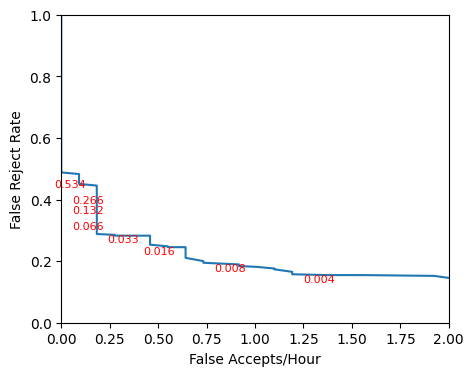

In [306]:
# DATA
ths = np.logspace(-3, 0, 100)
frr = [1 - sum(a > th) / len(a) for th in ths]
far = [sum(b > th) / (len(b) / 45000) for th in ths]

# PLOT
plt.figure(figsize=(5,4))
plt.plot(far, frr)
for i in range(0, len(ths), 10):  # Annotate every 10th point
    plt.annotate(f"{ths[i]:.3f}", (far[i], frr[i]), textcoords="offset points", 
                 xytext=(5,-5), ha='right', fontsize=8, color="red")
plt.xlabel("False Accepts/Hour")
plt.ylabel("False Reject Rate")
plt.xlim(0,2)
plt.ylim(0,1)
plt.show()


## ROC curves

In [78]:
import yaml
yamls = get_yamls_from_folder(folder="F:/models/hola-ayud_00/", wakeword="hola-ayud")
for y in yamls:
    with open(y, 'r') as f:
        data = yaml.safe_load(f)
        """print(data['layer_size'], y)"""

        """
        n_pos = data["batch_n_per_class"]["positive"]
        n_neg = sum([v for k, v in data["batch_n_per_class"].items()]) - n_pos
        print(n_neg/n_pos, y)"""

32 F:\models\hola-ayud_00\hola-ayud_00.yaml
32 F:\models\hola-ayud_00\hola-ayud_01.yaml
32 F:\models\hola-ayud_00\hola-ayud_02.yaml
32 F:\models\hola-ayud_00\hola-ayud_03.yaml
32 F:\models\hola-ayud_00\hola-ayud_04.yaml
32 F:\models\hola-ayud_00\hola-ayud_05.yaml
32 F:\models\hola-ayud_00\hola-ayud_06.yaml
32 F:\models\hola-ayud_00\hola-ayud_07.yaml
32 F:\models\hola-ayud_00\hola-ayud_08.yaml
32 F:\models\hola-ayud_00\hola-ayud_09.yaml
32 F:\models\hola-ayud_00\hola-ayud_1-real-person+TTS+piper.yaml
32 F:\models\hola-ayud_00\hola-ayud_1-real-person+TTS.yaml
32 F:\models\hola-ayud_00\hola-ayud_1-real-person.yaml
32 F:\models\hola-ayud_00\hola-ayud_10.yaml
64 F:\models\hola-ayud_00\hola-ayud_11.yaml
64 F:\models\hola-ayud_00\hola-ayud_12.yaml
32 F:\models\hola-ayud_00\hola-ayud_13.yaml
32 F:\models\hola-ayud_00\hola-ayud_14.yaml
32 F:\models\hola-ayud_00\hola-ayud_15.yaml
32 F:\models\hola-ayud_00\hola-ayud_16.yaml
32 F:\models\hola-ayud_00\hola-ayud_17.yaml
48 F:\models\hola-ayud_00\hol

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:30<00:00,  7.66s/it]


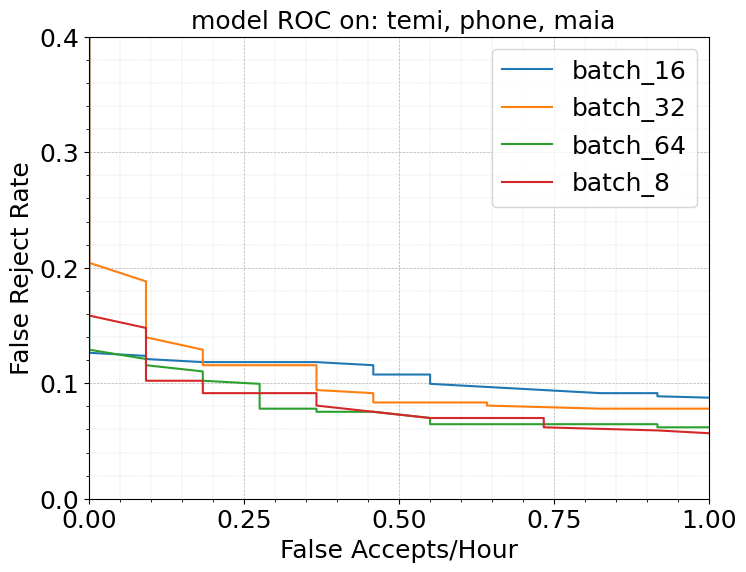

In [36]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/batch", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:16<00:00,  8.48s/it]


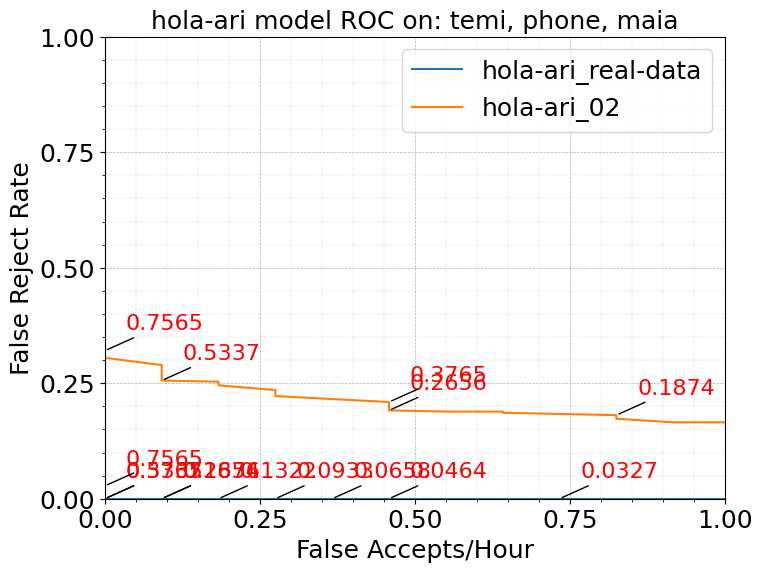

In [122]:
models = get_models_from_folder(folder="F:/models/hola-ari_00/", wakeword="real")
models.update(get_models_from_folder(folder="F:/models/hola-ari_00/", wakeword="02"))
plot_roc_comparison(models, wakeword="hola-ari", n_points=100, xlim=1, ylim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.83it/s]


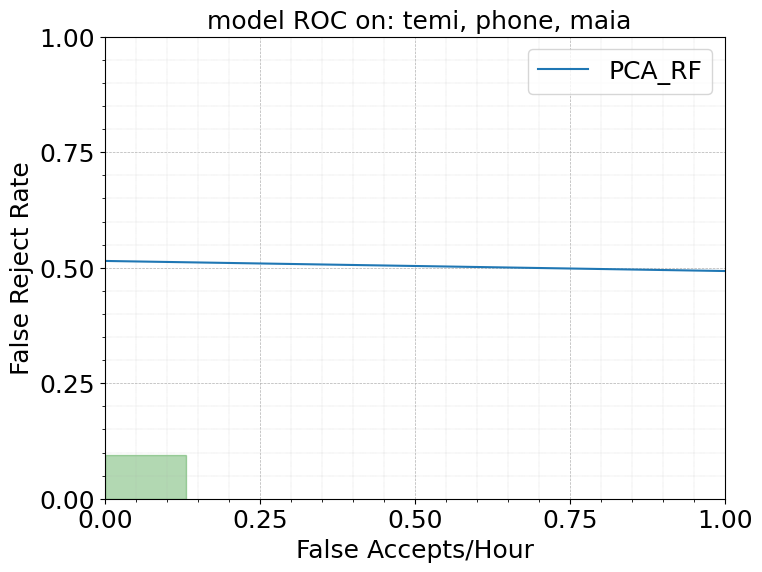

In [161]:
models = get_models_from_folder(folder="F:/models/hola-ayud_00/pca/", wakeword="PCA_RF")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  7.60s/it]


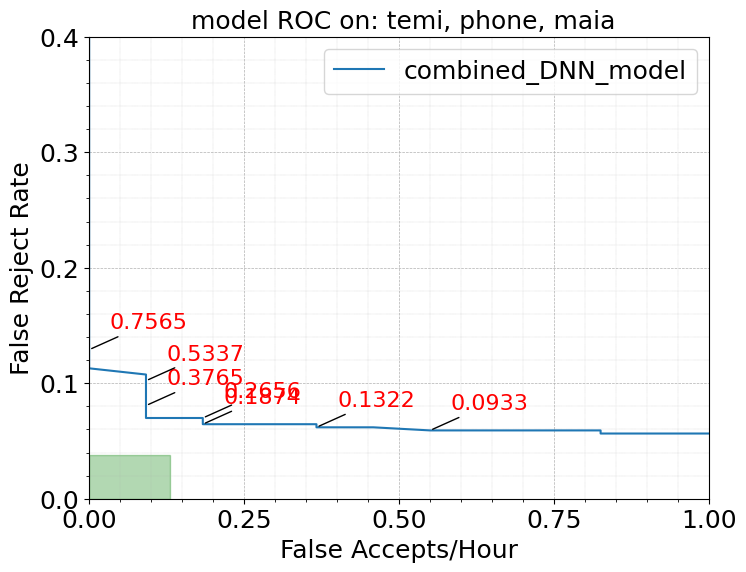

In [160]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/", wakeword="combined_DNN_model", depth=0)
# models.update(get_models_from_folder(folder="F:/models/hola-maia_00/experiments/hidden_layers", wakeword="5", depth=0))
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:33<00:00,  8.42s/it]


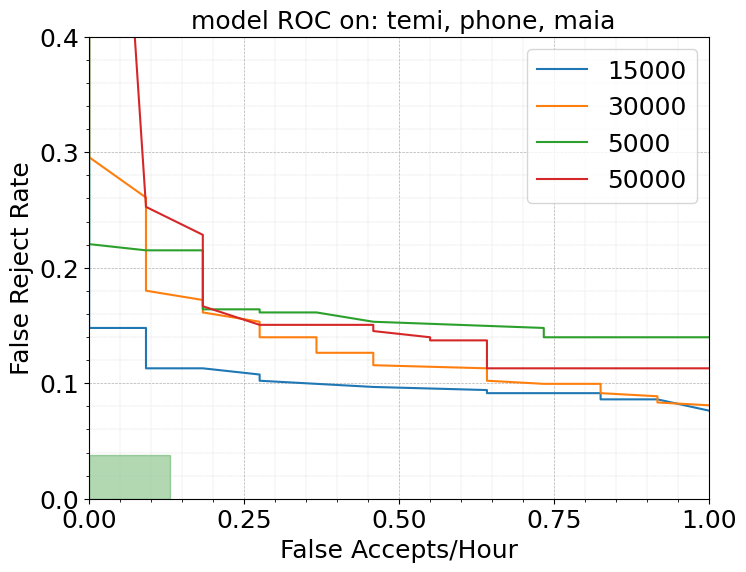

In [162]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/steps", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

In [131]:
get_models_from_folder(folder="F:/models/hola-maia_00/experiments/CL", wakeword="onnx")

{'3_ACL': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_ACL.onnx',
 '3_CL': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_CL.onnx',
 '3_CL2': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_CL2.onnx',
 '3_CL3': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_CL3.onnx',
 '3_train_CL': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_train_CL.onnx',
 '3_train_CL2': 'F:\\models\\hola-maia_00\\experiments\\CL\\3_train_CL2.onnx',
 '5_CL': 'F:\\models\\hola-maia_00\\experiments\\CL\\5_CL.onnx'}

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:29<00:00,  3.75s/it]


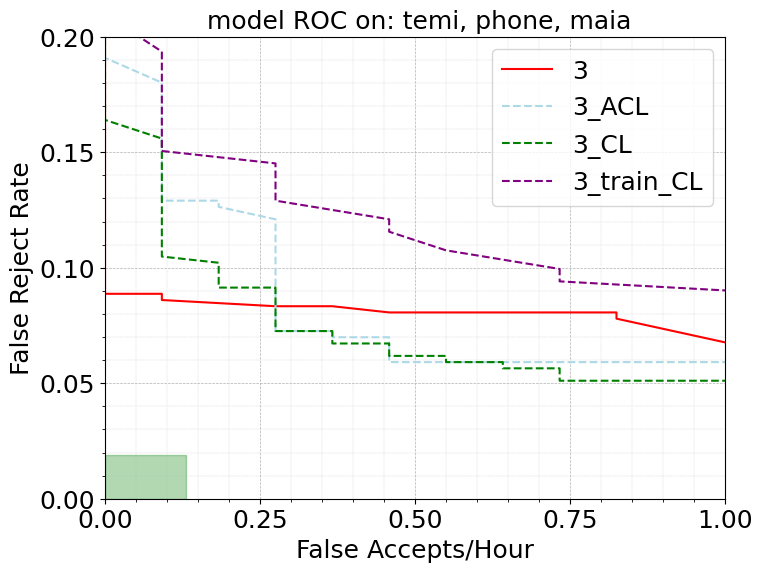

In [168]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/CL", wakeword="onnx")
# models = dict(list(models.items())[0:1])
wakeword = ""
n_points = 100 
results_folder = "F:/results" 
xlim = 1 
ylim = 0.2
show_n_thresholds = 0 
devices = ["temi", "phone", "maia"] 
ticks = 5 
fontsize = 18 
legend_loc = 'best'

# Select devices
device_subset = {"temi": 0, "phone": 1, "maia": 2}
selected_devices = [device_subset[k] for k in devices]

# Build plot
plt.figure(figsize=(8,6))
plt.title(f"{wakeword} model ROC on: " + ', '.join(devices), fontsize=fontsize)
ths = np.logspace(-3, 0, n_points)

for mdl_name, _ in tqdm(models.items()):
    if wakeword in mdl_name and "hola-" + wakeword not in mdl_name:

        if mdl_name == "3_ACL":
            ls = "--"
            color = "lightblue"
        elif mdl_name == "3_CL":
            ls = "--"
            color = "green"
        elif mdl_name == "3_CL2":
            ls = "--"
            color = "darkolivegreen"
            continue
        elif mdl_name == "3_CL3":
            ls = "--"
            color = "limegreen"
            continue
        elif mdl_name == "5_CL":
            ls = "--"
            color = "brown"
            continue
        elif mdl_name == "3_train_CL":
            ls = "--"
            color = "purple"
        elif mdl_name == "3_train_CL2":
            ls = "--"
            color = "green"
            continue
        elif mdl_name == "3":
            ls = "-"
            color = "red"
        
        try:
            pos = np.load(f"{results_folder}/{mdl_name}_positive_scores.npy")
            neg = np.load(f"{results_folder}/{mdl_name}_negative_scores.npy")
        except OSError:
            continue

        # Filter devices
        pos = np.hstack([val for i, val in enumerate(np.array_split(pos, 3)) if i in selected_devices])
        
        # DATA
        frr = [1 - sum(pos > th) / len(pos) for th in ths]
        far = [sum(neg > th) / (len(neg) / 45000) for th in ths]
        
        plt.plot(far, frr, label=mdl_name, color=color, ls=ls)

        if show_n_thresholds > 0:
            step = len(ths) // show_n_thresholds
            for i in range(0, len(ths), step):  # Annotate selected points
                plt.annotate(f"{ths[i]:.4f}", (far[i], frr[i]), textcoords="offset points", 
                             xytext=(10,20), ha='left', fontsize=fontsize-2, color="red",
                             arrowprops=dict(arrowstyle="simple", color="red"))
    else:
        print(f"Skipping {mdl_name} since wakeword {wakeword} is being evaluated")

plt.axvspan(0, 0.13, ymin=0, ymax=0.1/plt.ylim()[1], color='green', alpha=0.3)

plt.ylim(0, ylim)
plt.xlim(0, xlim)
plt.xlabel("False Accepts/Hour", fontsize=fontsize)
plt.ylabel("False Reject Rate", fontsize=fontsize)
plt.xticks(np.linspace(0, xlim, ticks), fontsize=fontsize)
plt.yticks(np.linspace(0, ylim, ticks), fontsize=fontsize)
if legend_loc == "best":
    plt.legend(loc=legend_loc, fontsize=fontsize)
else:
    plt.legend(loc=legend_loc, bbox_to_anchor=(1, 0.5), fontsize=fontsize)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.minorticks_on()
plt.grid(True, which='minor', linestyle=':', linewidth=0.3)
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.60s/it]


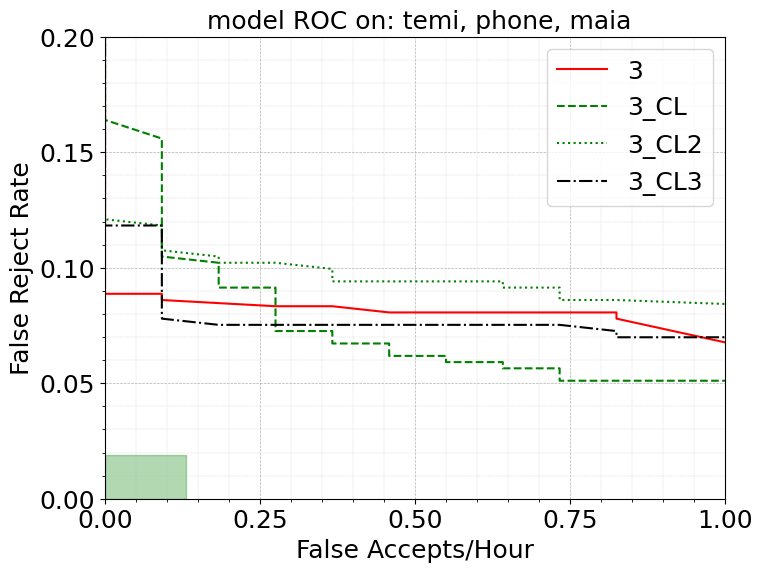

In [169]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/CL", wakeword="onnx")
# models = dict(list(models.items())[0:1])
wakeword = ""
n_points = 100 
results_folder = "F:/results" 
xlim = 1 
ylim = 0.2
show_n_thresholds = 0 
devices = ["temi", "phone", "maia"] 
ticks = 5 
fontsize = 18 
legend_loc = 'best'

# Select devices
device_subset = {"temi": 0, "phone": 1, "maia": 2}
selected_devices = [device_subset[k] for k in devices]

# Build plot
plt.figure(figsize=(8,6))
plt.title(f"{wakeword} model ROC on: " + ', '.join(devices), fontsize=fontsize)
ths = np.logspace(-3, 0, n_points)

for mdl_name, _ in tqdm(models.items()):
    if wakeword in mdl_name and "hola-" + wakeword not in mdl_name:

        if mdl_name == "3_ACL":
            ls = "--"
            color = "azure"
            continue
        elif mdl_name == "3_CL":
            ls = "--"
            color = "green"
        elif mdl_name == "3_CL2":
            ls = ":"
            color = "green"
        elif mdl_name == "3_CL3":
            ls = "-."
            color = "black"
        elif mdl_name == "5_CL":
            ls = "--"
            color = "brown"
            continue
        elif mdl_name == "3_train_CL":
            ls = "--"
            color = "red"
            continue
        elif mdl_name == "3_train_CL2":
            ls = "--"
            color = "green"
            continue
        elif mdl_name == "3":
            ls = "-"
            color = "red"
        
        try:
            pos = np.load(f"{results_folder}/{mdl_name}_positive_scores.npy")
            neg = np.load(f"{results_folder}/{mdl_name}_negative_scores.npy")
        except OSError:
            continue

        # Filter devices
        pos = np.hstack([val for i, val in enumerate(np.array_split(pos, 3)) if i in selected_devices])
        
        # DATA
        frr = [1 - sum(pos > th) / len(pos) for th in ths]
        far = [sum(neg > th) / (len(neg) / 45000) for th in ths]
        
        plt.plot(far, frr, label=mdl_name, color=color, ls=ls)

        if show_n_thresholds > 0:
            step = len(ths) // show_n_thresholds
            for i in range(0, len(ths), step):  # Annotate selected points
                plt.annotate(f"{ths[i]:.4f}", (far[i], frr[i]), textcoords="offset points", 
                             xytext=(10,20), ha='left', fontsize=fontsize-2, color="red",
                             arrowprops=dict(arrowstyle="simple", color="red"))
    else:
        print(f"Skipping {mdl_name} since wakeword {wakeword} is being evaluated")

plt.axvspan(0, 0.13, ymin=0, ymax=0.1/plt.ylim()[1], color='green', alpha=0.3)

plt.ylim(0, ylim)
plt.xlim(0, xlim)
plt.xlabel("False Accepts/Hour", fontsize=fontsize)
plt.ylabel("False Reject Rate", fontsize=fontsize)
plt.xticks(np.linspace(0, xlim, ticks), fontsize=fontsize)
plt.yticks(np.linspace(0, ylim, ticks), fontsize=fontsize)
if legend_loc == "best":
    plt.legend(loc=legend_loc, fontsize=fontsize)
else:
    plt.legend(loc=legend_loc, bbox_to_anchor=(1, 0.5), fontsize=fontsize)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.minorticks_on()
plt.grid(True, which='minor', linestyle=':', linewidth=0.3)
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:58<00:00,  8.31s/it]


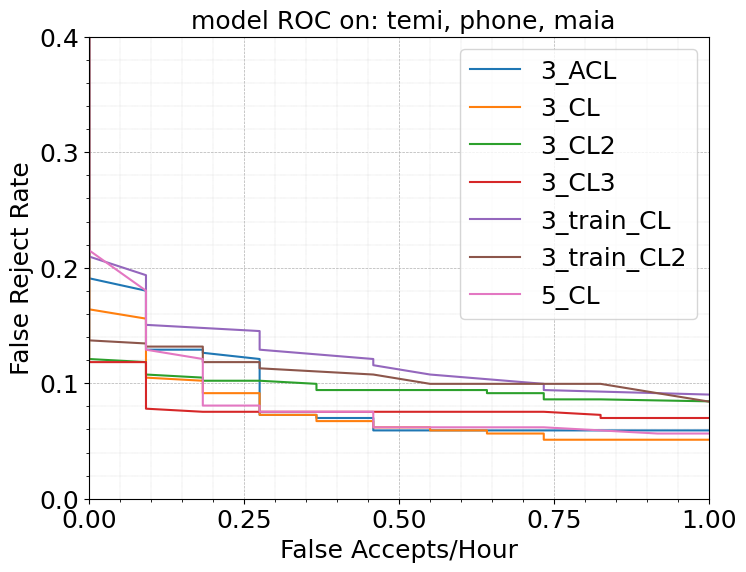

In [ ]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/CL", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|██████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<?, ?it/s]
C:\Users\gbartag\AppData\Local\Temp\ipykernel_49344\1551295789.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc=legend_loc, fontsize=fontsize)


Skipping hola-ari_00 since wakeword onnx is being evaluated
Skipping hola-ari_01 since wakeword onnx is being evaluated
Skipping hola-ari_02 since wakeword onnx is being evaluated
Skipping hola-ari_03 since wakeword onnx is being evaluated
Skipping hola-ari_04 since wakeword onnx is being evaluated
Skipping hola-ari_05 since wakeword onnx is being evaluated
Skipping hola-ari_06 since wakeword onnx is being evaluated
Skipping hola-ari_07 since wakeword onnx is being evaluated
Skipping hola-ari_08 since wakeword onnx is being evaluated
Skipping hola-ari_real-data since wakeword onnx is being evaluated


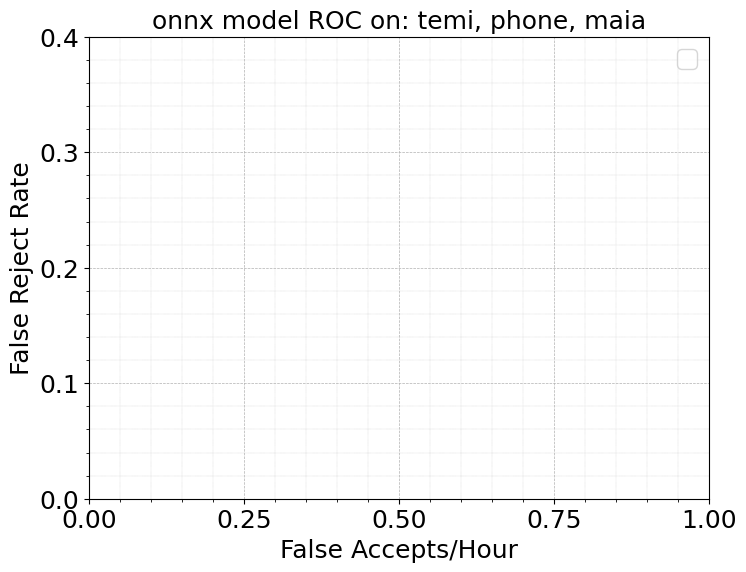

In [45]:
models = get_models_from_folder(folder="F:/models/hola-ari_00", wakeword="onnx")
plot_roc_comparison(models, wakeword="onnx", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:47<00:00,  7.89s/it]


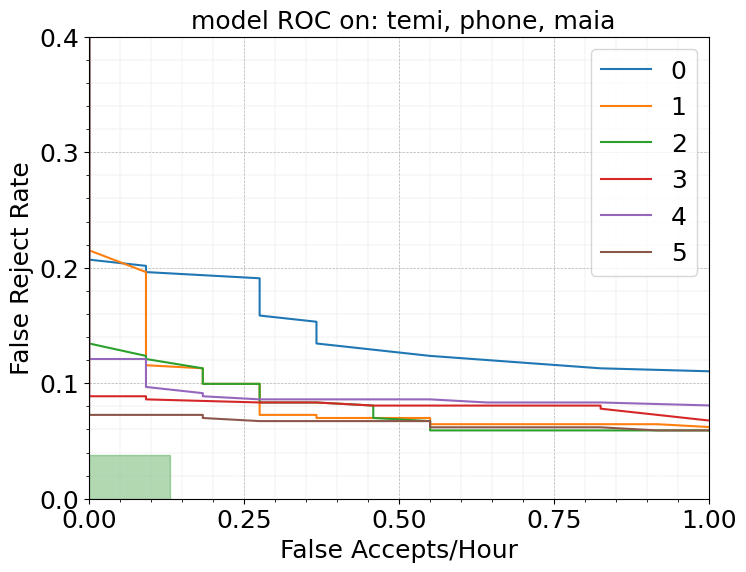

In [165]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/hidden_layers", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:33<00:00,  8.49s/it]


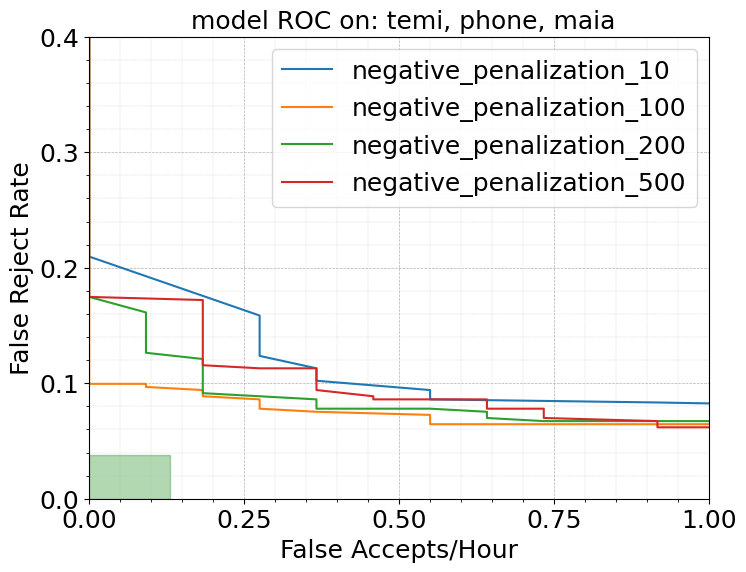

In [166]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/negative_penalization", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:32<00:00,  8.13s/it]


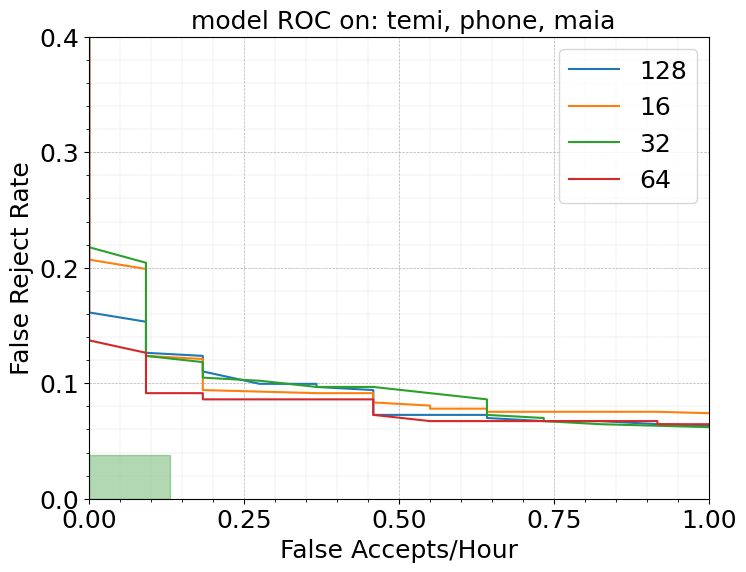

In [167]:
models = get_models_from_folder(folder="F:/models/hola-maia_00/experiments/layer_size", wakeword="onnx")
plot_roc_comparison(models, wakeword="", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [03:34<00:00, 26.85s/it]


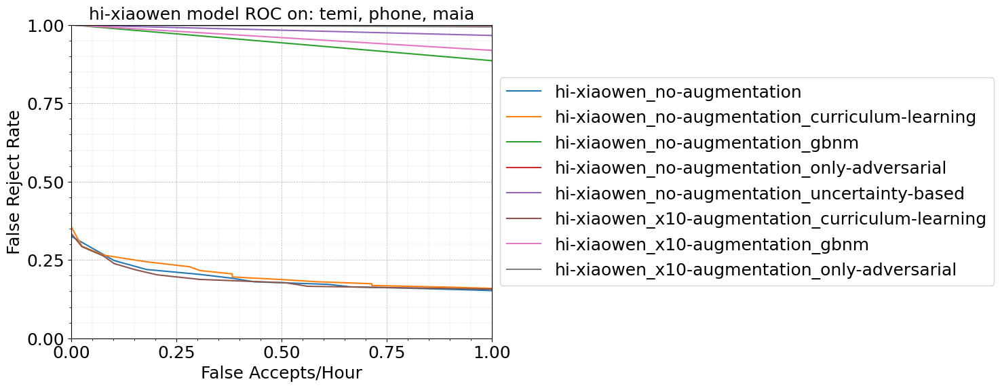

In [44]:
models = get_models_from_folder(folder="F:/models/", wakeword="hi-xiaowen", depth=1)
plot_roc_comparison(models, wakeword="hi-xiaowen", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0, legend_loc="center left")

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [01:07<00:00,  8.39s/it]


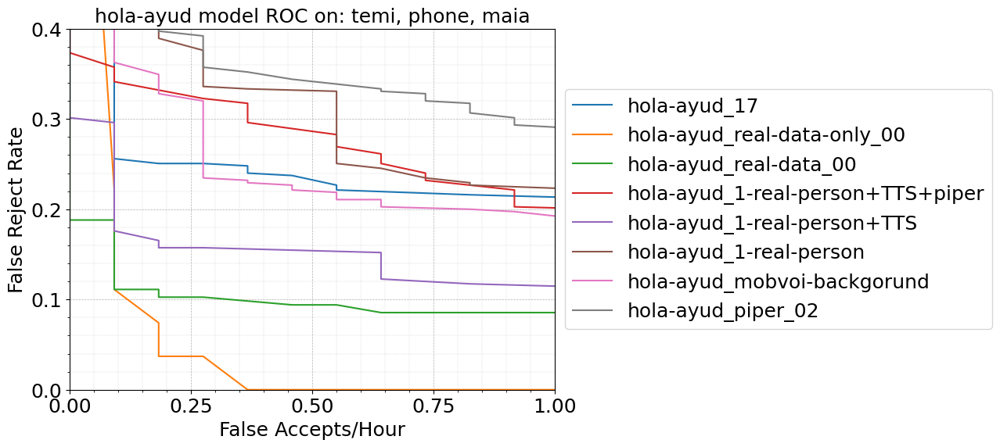

In [28]:
models =      get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_17", depth=1)
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_piper_00", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data-only_00", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data_00", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_1-real-person", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_1-real-person+TTS", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_1-real-person+TTS+piper", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_mobvoi-backgorund", depth=1))
models.update(get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_piper_02", depth=1))

plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

  0%|                                                                                           | 0/11 [00:00<?, ?it/s]

Skipping 3_CL since wakeword hola-maia is being evaluated
Skipping 3_CL2 since wakeword hola-maia is being evaluated


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:24<00:00,  2.19s/it]


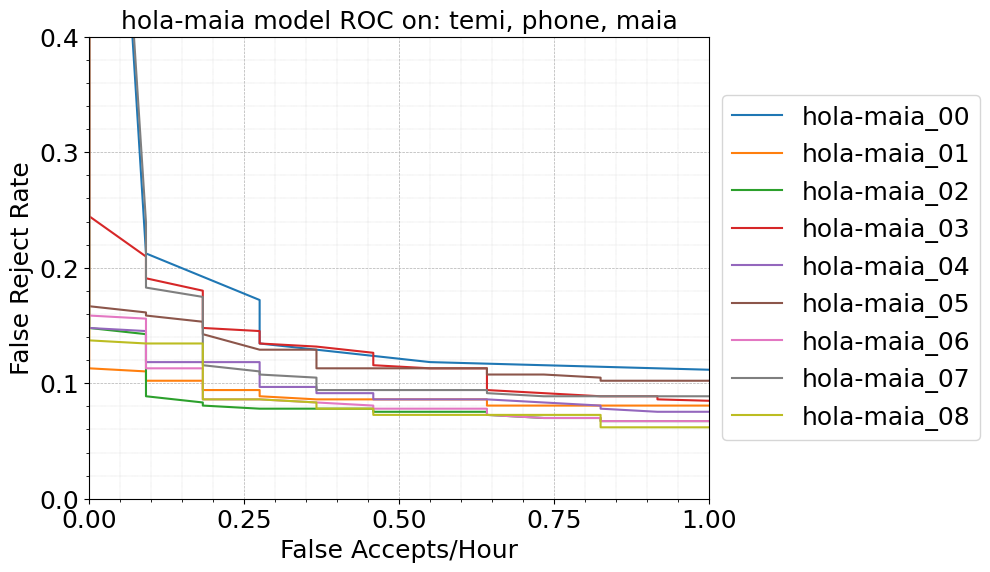

In [55]:
models = get_models_from_folder(folder="F:/models/hola-maia_00", wakeword="hola-maia", depth=0)
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.53s/it]


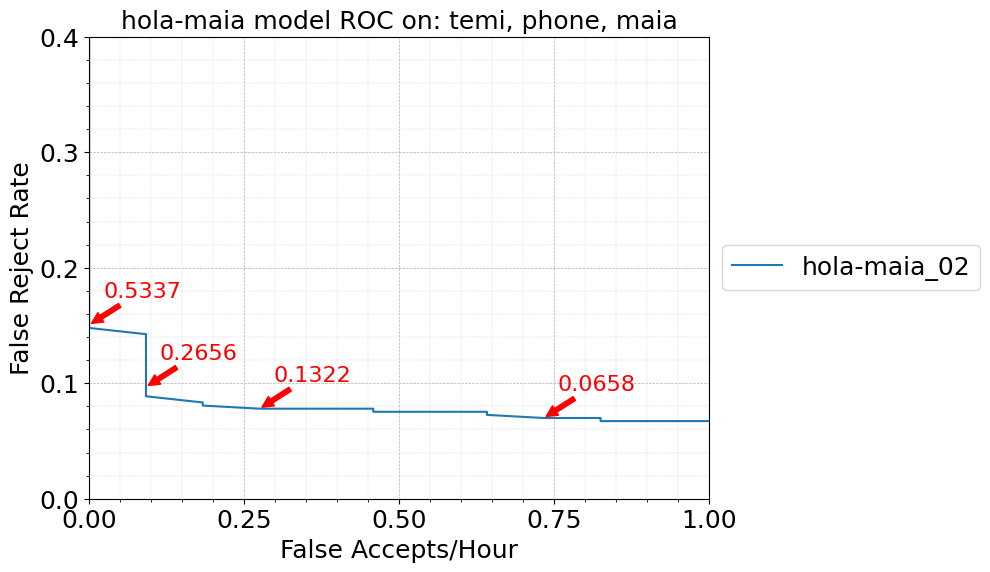

In [44]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-maia_02", depth=1)
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, ylim=0.4, results_folder="F:/results", show_n_thresholds=10)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.46s/it]


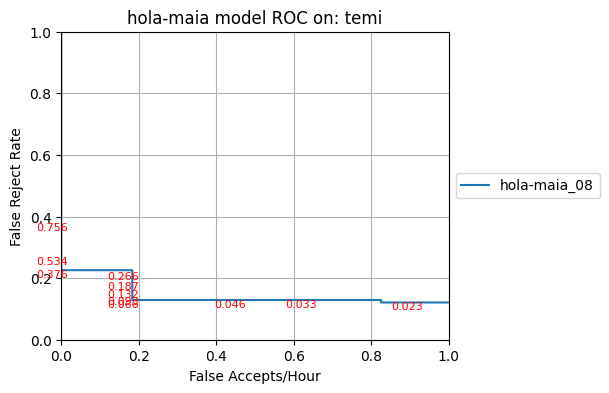

In [34]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-maia_08")
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["temi"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.42s/it]


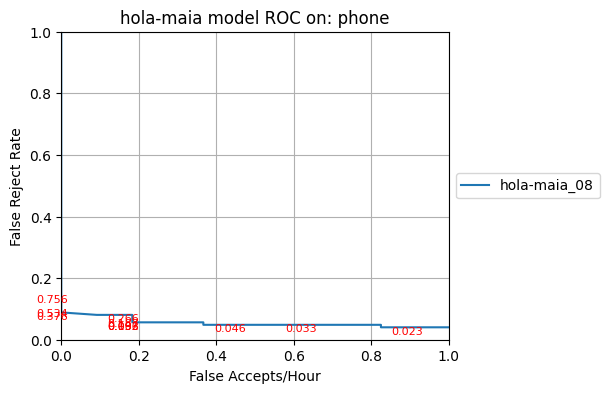

In [35]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-maia_08")
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["phone"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.50s/it]


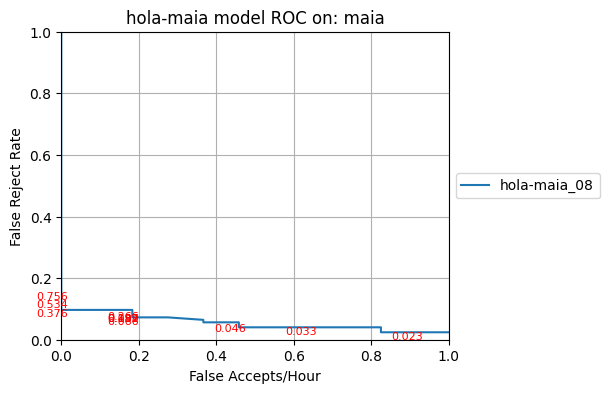

In [36]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-maia_08")
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["maia"])

100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [00:50<00:00,  2.38s/it]


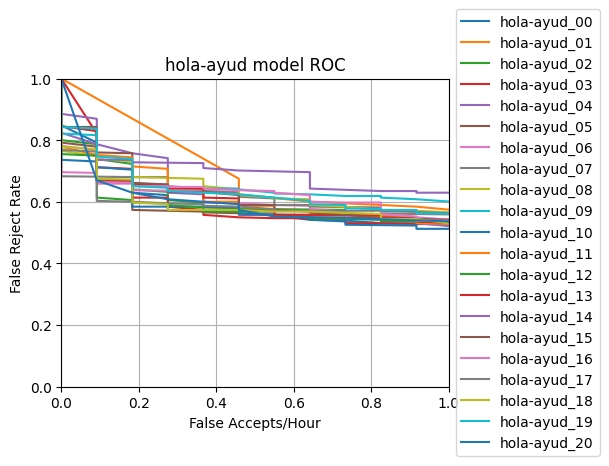

In [18]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results/gain+10", show_n_thresholds=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [00:49<00:00,  2.36s/it]


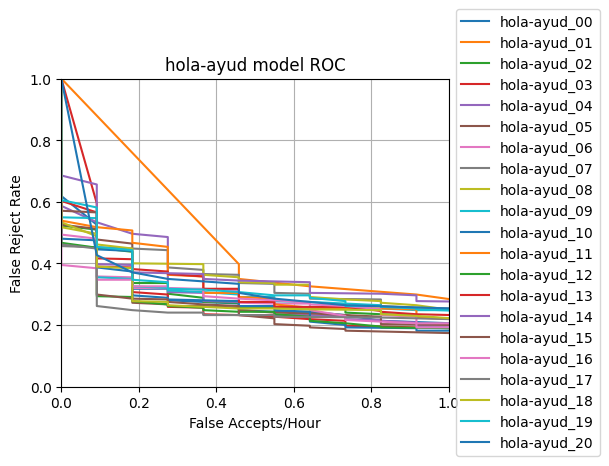

In [19]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results/gain+2", show_n_thresholds=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.33s/it]


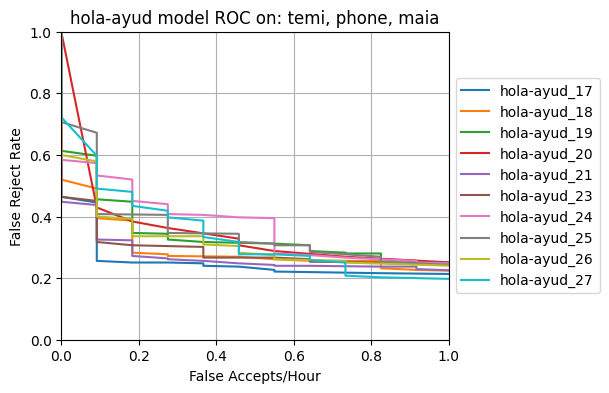

In [39]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud")
models = dict(list(models.items())[-20:-10])
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:22<00:00, 11.41s/it]


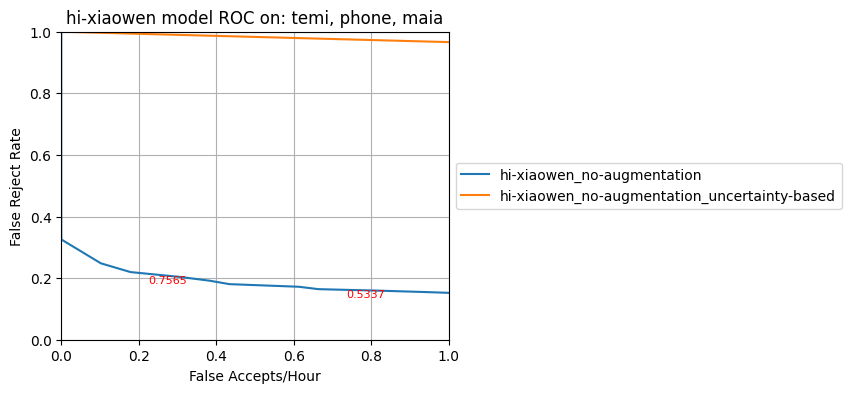

In [19]:
models = get_models_from_folder(folder="F:/models/", wakeword="hi-xiaowen", depth=1)
plot_roc_comparison(models, wakeword="hi-xiaowen", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:43<00:00,  4.36s/it]


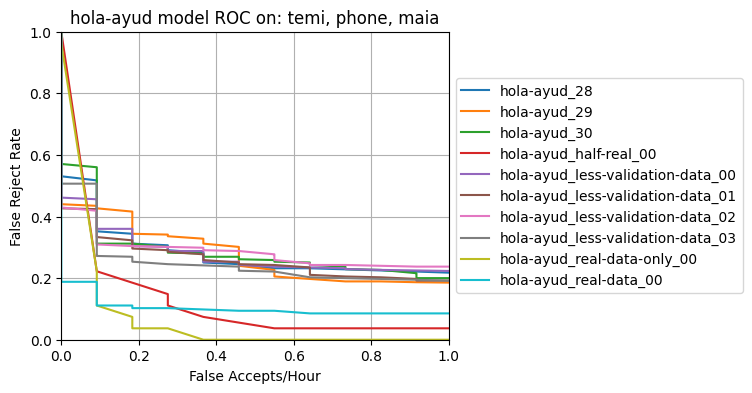

In [12]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud")
models = dict(list(models.items())[-10:])
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.31s/it]


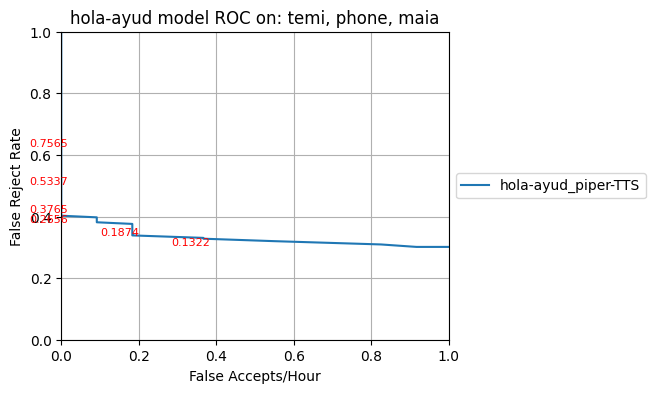

In [12]:
models = get_models_from_folder(folder="F:/models/hola-ayud_00", wakeword="hola-ayud_piper-TTS")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.79s/it]


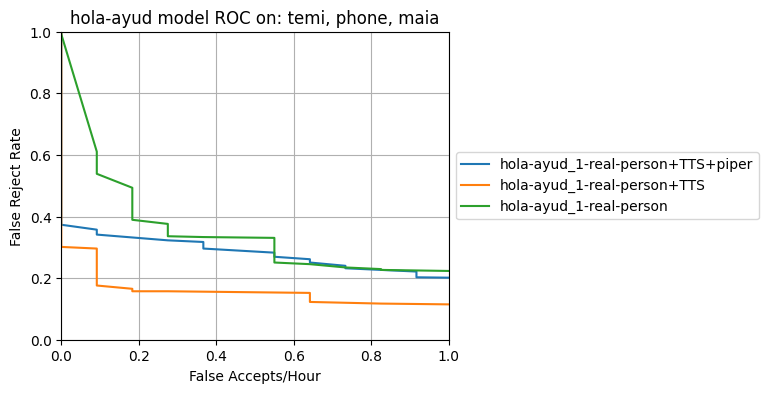

In [18]:
models = get_models_from_folder(folder="F:/models/hola-ayud_00", wakeword="hola-ayud_1-real")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


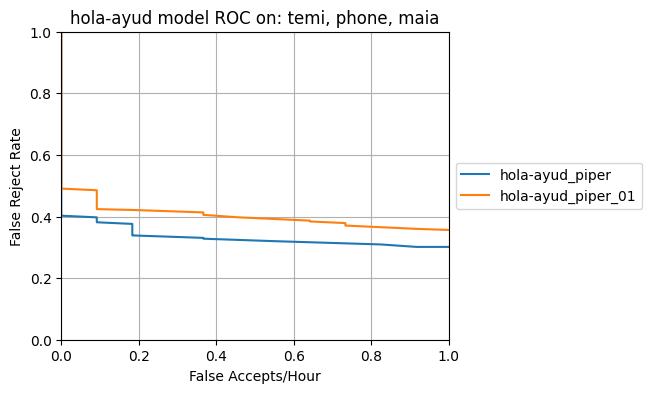

In [20]:
models = get_models_from_folder(folder="F:/models/hola-ayud_00", wakeword="hola-ayud_piper")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.34s/it]


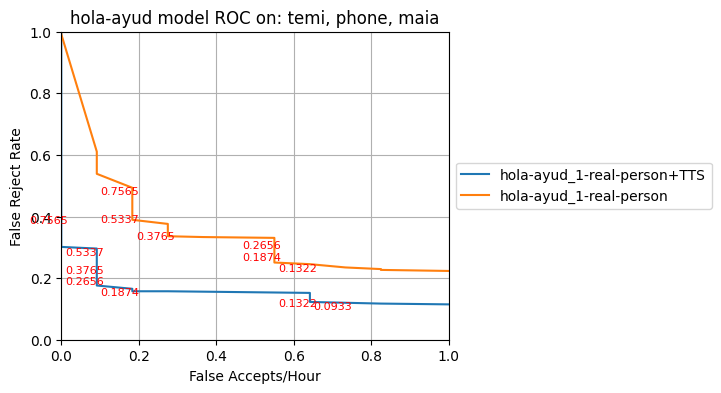

In [33]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_1-real-person")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.37s/it]


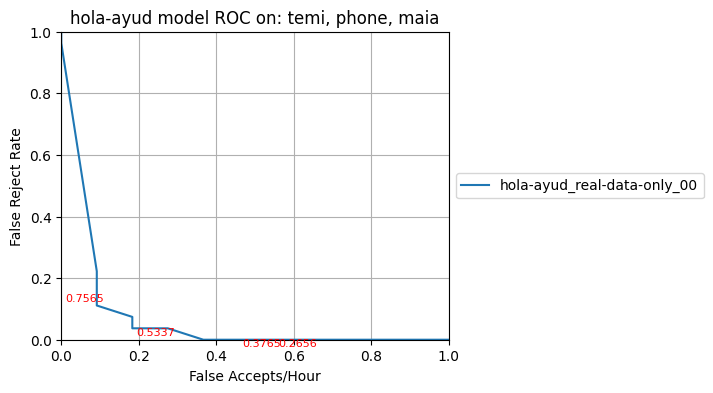

In [18]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data-only")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.31s/it]


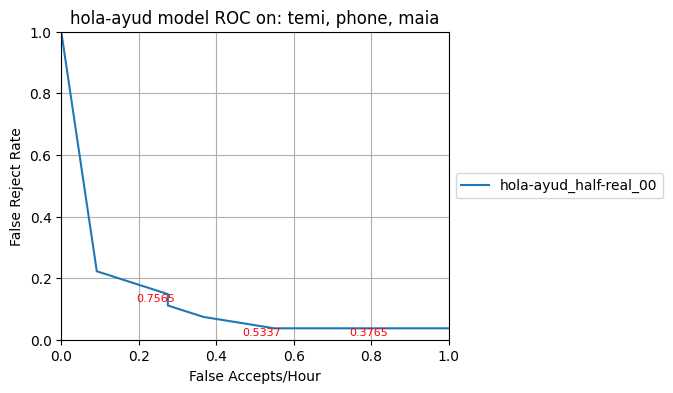

In [40]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_half-real")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.53s/it]


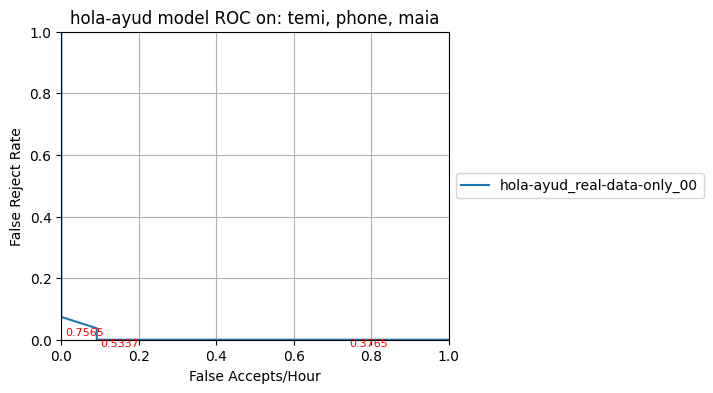

In [31]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data-only")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.52s/it]


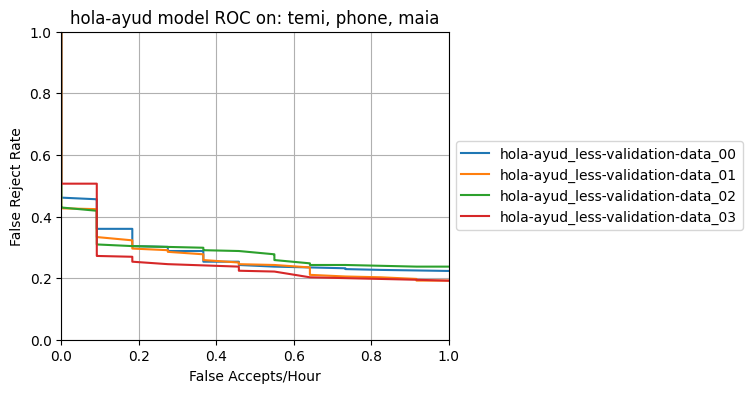

In [18]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_less")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:33<00:00,  3.71s/it]


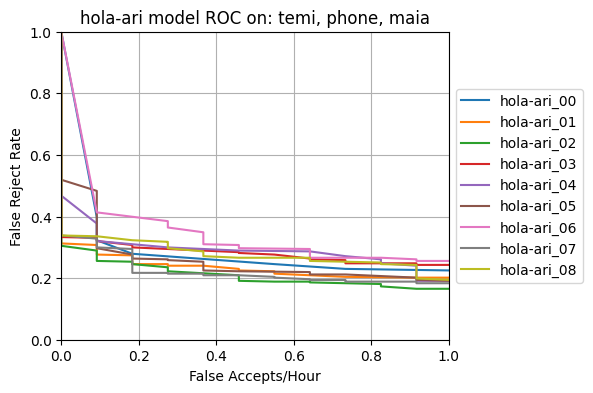

In [20]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ari")
plot_roc_comparison(models, wakeword="hola-ari", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:31<00:00,  3.54s/it]


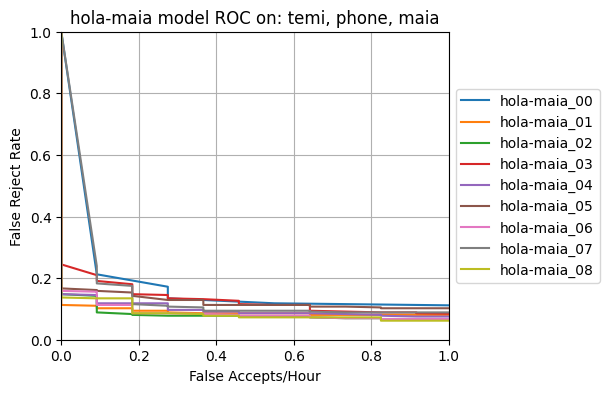

In [21]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-maia")
plot_roc_comparison(models, wakeword="hola-maia", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.64s/it]


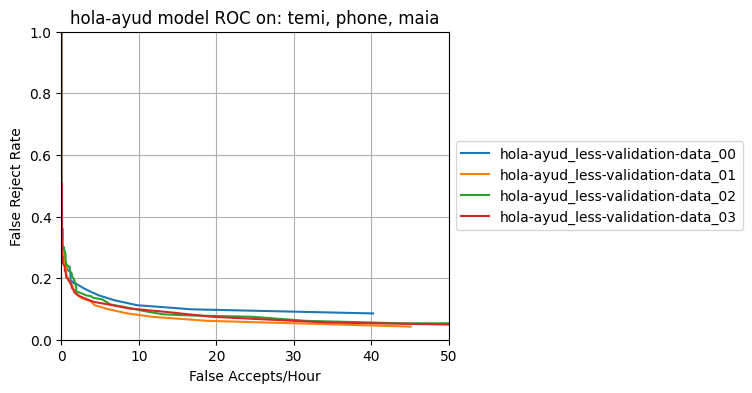

In [19]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_less")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=50, results_folder="F:/results", show_n_thresholds=0)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


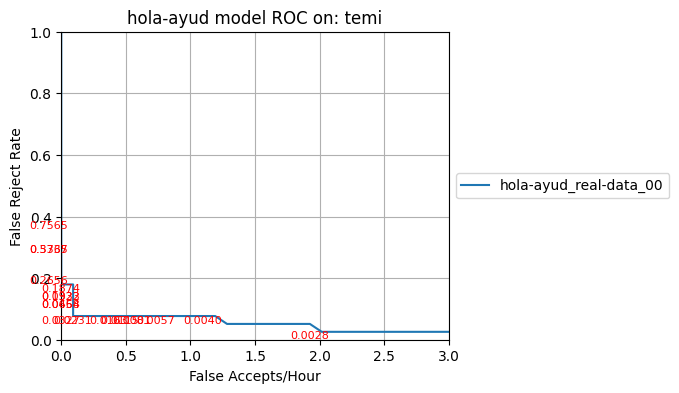

In [21]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=3, results_folder="F:/results", show_n_thresholds=20, devices=["temi"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.38s/it]


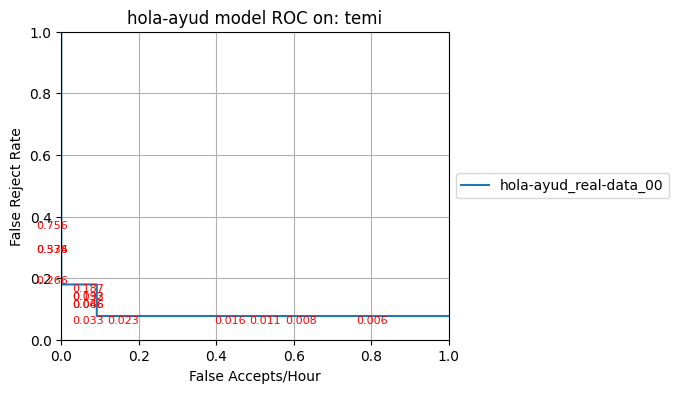

In [29]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["temi"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.49s/it]


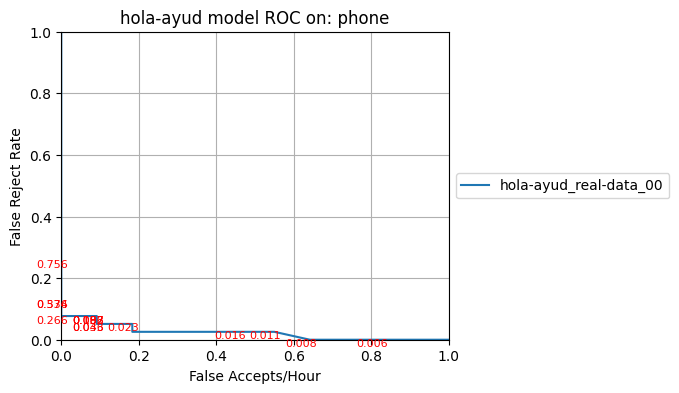

In [25]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["phone"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.52s/it]


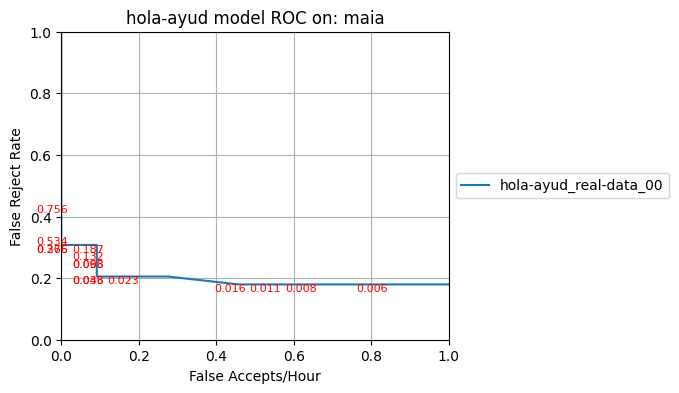

In [26]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20, devices=["maia"])

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.48s/it]


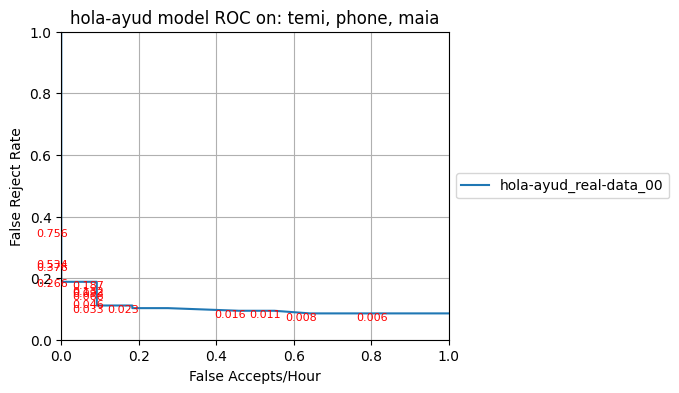

In [28]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.48s/it]


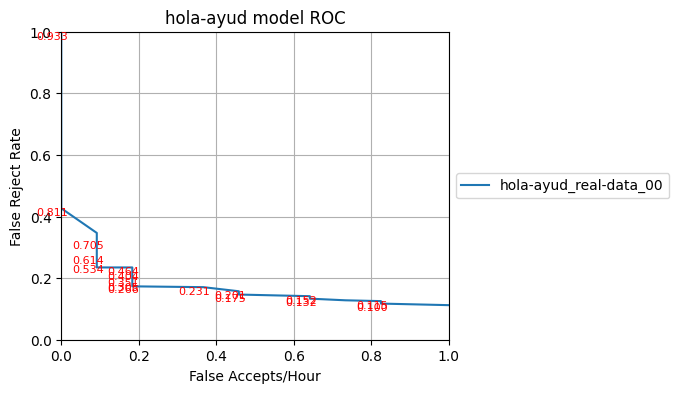

In [182]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_real-data")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=40)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


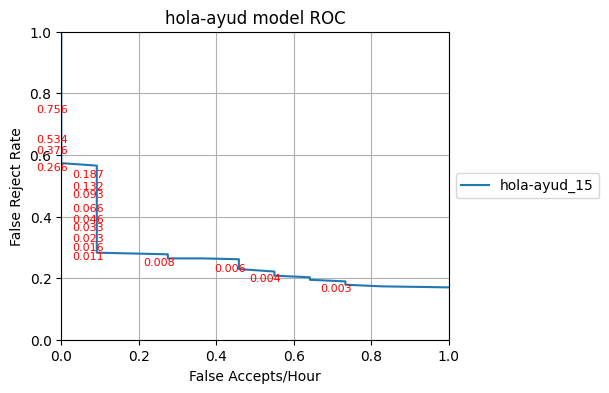

In [180]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud_15")
plot_roc_comparison(models, wakeword="hola-ayud", n_points=100, xlim=1, results_folder="F:/results", show_n_thresholds=20)

## FRR

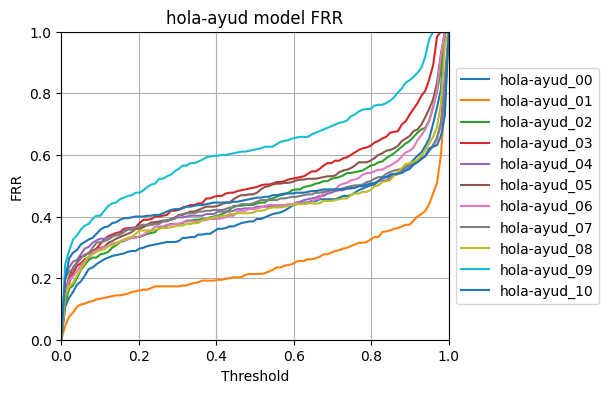

In [346]:
models = get_models_from_folder(folder="F:/models/", wakeword="hola-ayud")
plot_frr_comparison(models, wakeword="hola-ayud", n_points=100, results_folder="F:/results/")

## FAR

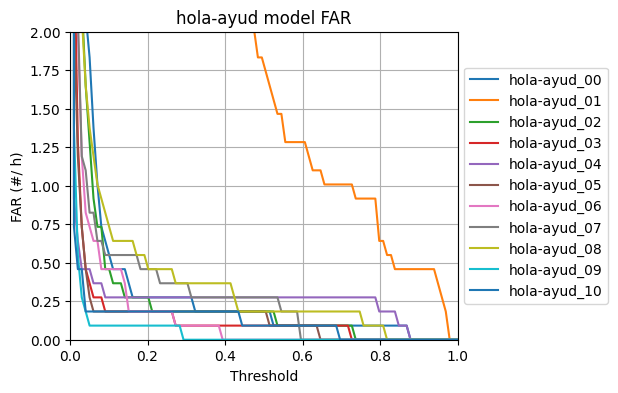

In [349]:
plot_far_comparison(models, wakeword="hola-ayud", n_points=100, results_folder="F:/results", ylim=2)

## Display training history

In [14]:
import pickle

file_path = "F:/models/hola-ayud_00/training_histories/hola-ayud_1-real-person+TTS_history.pkl"
with open(file_path, "rb") as f:  # Open the file in binary read mode
    hist = pickle.load(f)  # Load the object from the file

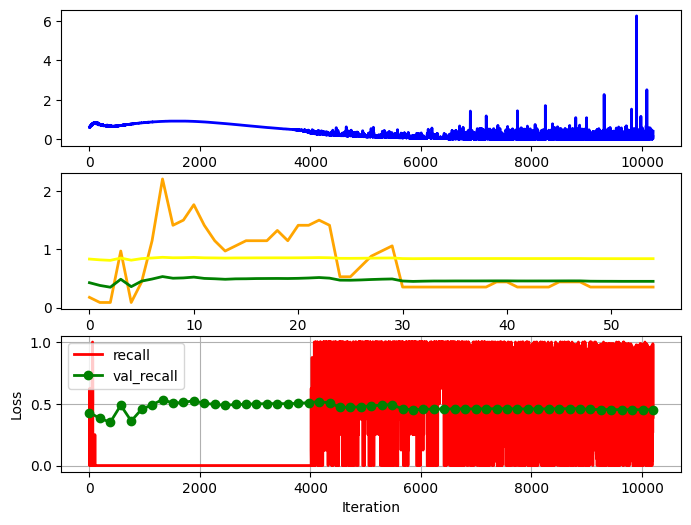

In [15]:
data = hist["val_recall"]  # Replace this with your existing array

# Map the 55 points onto an x-axis of 1800
x_mapped = np.linspace(0, len(hist["loss"]), len(hist["val_recall"]))  # len(data) ensures 55 points are mapped

# Plot the loss
plt.figure(figsize=(8, 6))
# plt.title("Training Metrics Over Epochs")

plt.subplot(311)
plt.plot(hist["loss"][:], label="loss", color="blue", linewidth=2)

plt.subplot(312)
plt.plot(hist["val_fp_per_hr"], label="val_fp_per_hr", color="orange", linewidth=2)
plt.plot(hist["val_accuracy"], label="val_accuracy", color="yellow", linewidth=2)
plt.plot(hist["val_recall"], label="val_recall", color="green", linewidth=2)

plt.subplot(313)
plt.plot(hist["recall"], label="recall", color="red", linewidth=2)
plt.plot(x_mapped, hist["val_recall"], '-o', label="val_recall", color="green", linewidth=2)
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Single model tests

## Load Trained openWakeWord Model(s)

In [32]:
# Load a trained openWakeWord model
model_path = 'F:\\models\\alexa_03\\alexa_07.onnx'
model_name = os.path.splitext(os.path.basename(model_path))[0]
oww = openwakeword.Model(wakeword_models=[model_path])

## Tests on positive data (False reject rate/false negative rate)

In [33]:
# Get paths to test files (positive examples)
clips = [str(i) for i in Path("F:\\data\\test\\alexa_test_clips\\").glob("**/*.wav")] # assumes these clips are 16khz, 16-bit WAV files
positive_scores = predict_on_wavs(oww, clips, model_name)

# Count how many files had a prediction above a given threshold
threshold = 0.5
fn = 0
fn_clips = []
for i, positive_score in enumerate(positive_scores):
    if positive_score < threshold:
        fn += 1
        fname = clips[i]
        fn_clips.append(fname)

print(f"False Reject Rate @{threshold} threshold: {fn/len(clips)}")

False Reject Rate @0.5 threshold: 0.0486322188449848


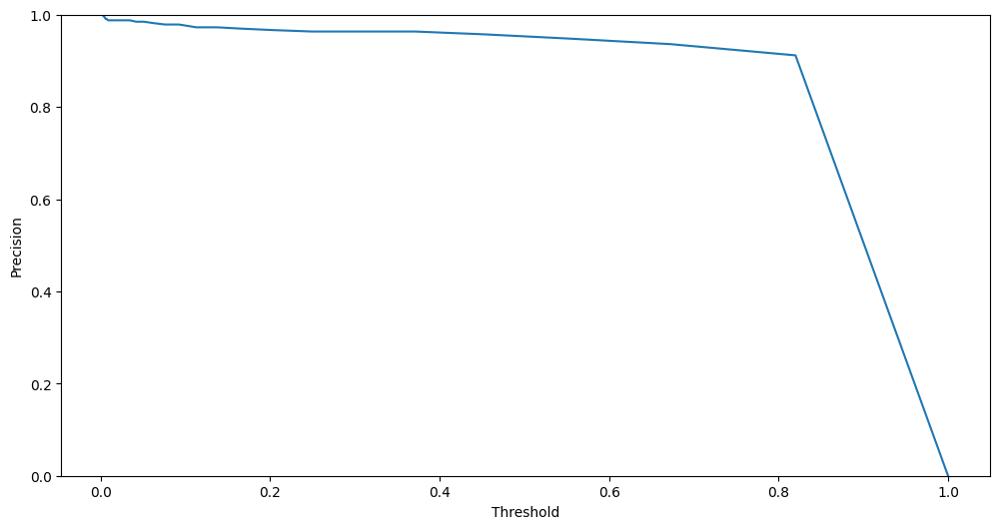

In [34]:
thresholds = np.logspace(-0.5,2, num=30) / 100
precision_by_threshold = np.array([sum(np.array(positive_scores) > th) for th in thresholds]) / len(positive_scores)
plt.figure(figsize=(12,6))
plt.plot(thresholds, precision_by_threshold)
plt.ylim(0, 1)
plt.xlabel("Threshold")
plt.ylabel("Precision")
plt.show()

In [28]:
# (optionally) listen to the falsely rejected clips
import scipy
for i in fn_clips:
    sr, dat = scipy.io.wavfile.read(i)
    ipd.display(ipd.Audio(dat, rate=16000, normalize=True, autoplay=False))

## Tests on negative data (False accept rate/false positive rate)

In [349]:
# Predict on negative data
input_features = np.load("F:/data/train/NEGATIVE/tv3_train.npy")
neg = predict_on_features(model_path, input_features)

False accepts @0.5 threshold: 3 in 18.2h --> 0.16451 FA/hour



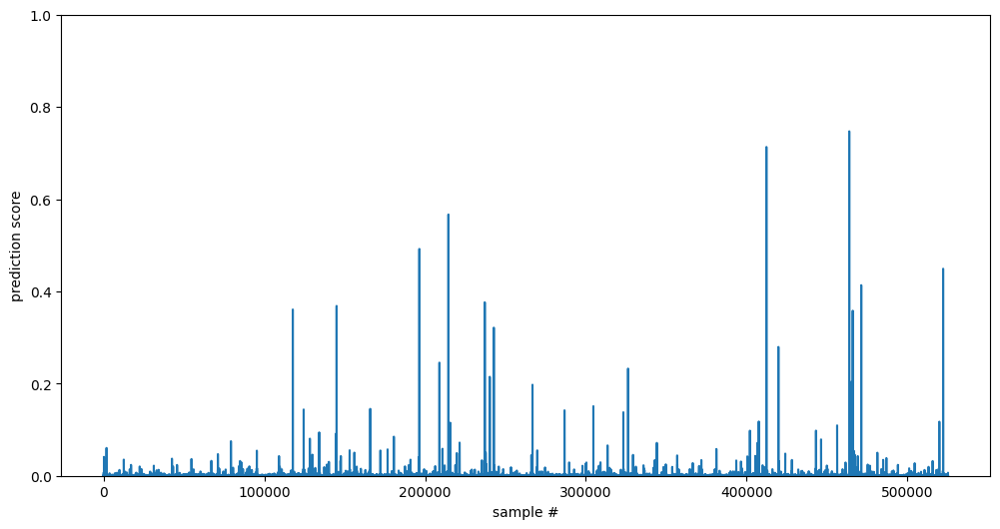

In [350]:
# Calculate the number of false positives
th = 0.5
num_false_positives = get_false_activations(negative_scores, threshold=th, grouping_window=1)
hours_negative_data = len(negative_scores_1) / 1800 / 16 # Each clip is 2 seconds (1800 clips/hour) / non streaming features (/16)
print(f"False accepts @{th} threshold: {num_false_positives} in {round(hours_negative_data, 1)}h --> {round(num_false_positives/hours_negative_data, 5)} FA/hour")
print()

# Show results in time
plt.figure(figsize=(12,6))
plt.plot(negative_scores)
plt.ylim(0,1)
plt.ylabel("prediction score")
plt.xlabel("sample #")
plt.show()

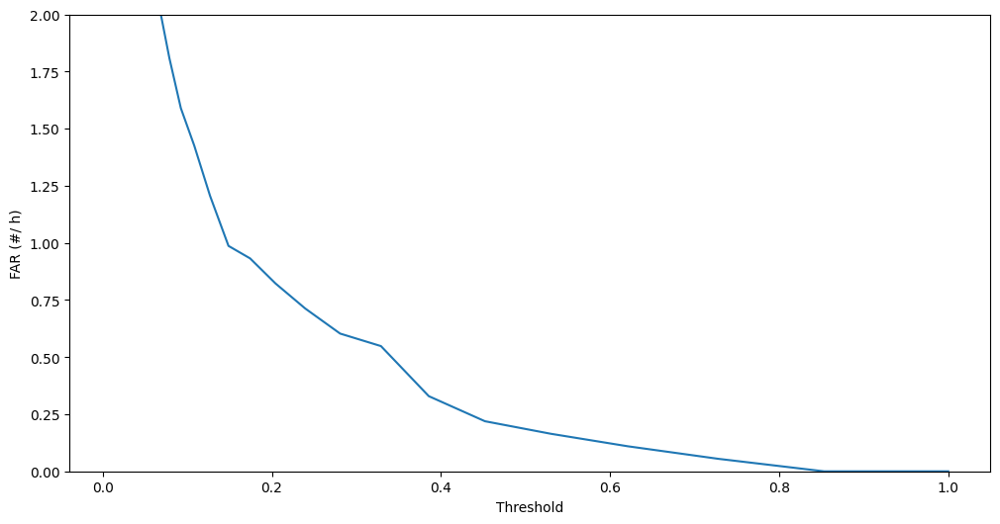

In [377]:
thresholds = np.logspace(0,2, num=30) / 100
far = np.array([get_false_activations(negative_scores, threshold=th, grouping_window=1) for th in x]) / hours_negative_data
plt.figure(figsize=(12,6))
plt.plot(thresholds, far)
plt.ylabel("FAR (#/ h)")
plt.xlabel("Threshold")
plt.ylim(0,2)
plt.show()

## Plot False-Acccept/False-Reject Curve

In [297]:
# Compute and plot the false-accept/false-reject curve from the metrics above (requires that all cells have been run)

from openwakeword.metrics import generate_roc_curve_fprs, generate_roc_curve_tprs

100%|█████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 24905.31it/s]


Text(0, 0.5, 'False Reject Rate')

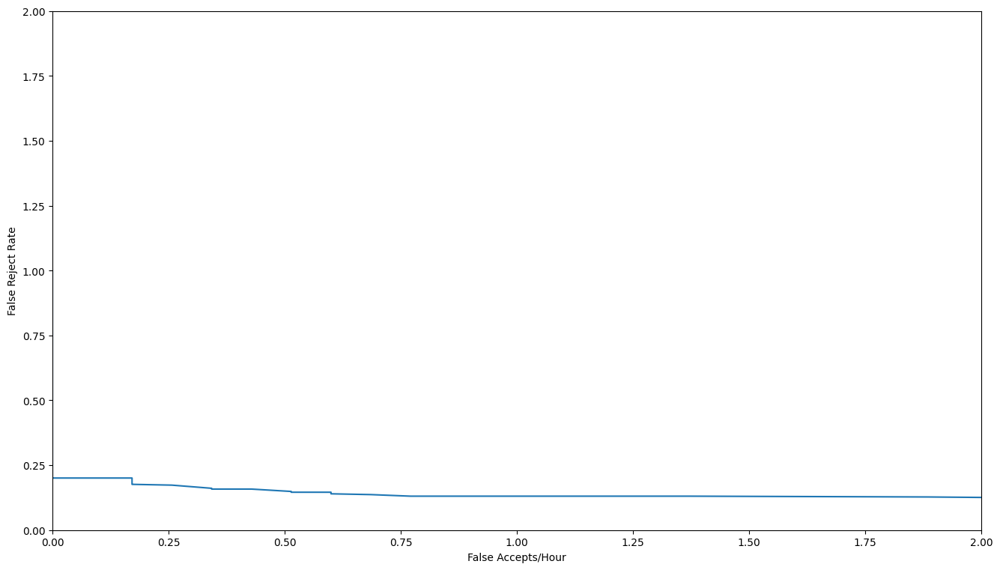

In [298]:
fprs = generate_roc_curve_fprs(np.array(negative_scores), n_points=100)
tprs = generate_roc_curve_tprs(positive_scores, n_points=100)
frr = [1 - i for i in tprs]

# Make plot
plt.figure(figsize=(16,9))
plt.plot(fprs, frr)
plt.ylim(0,max(frr)*2)
plt.xlim(0,2)
plt.xlabel("False Accepts/Hour")
plt.ylabel("False Reject Rate")